# Exploring Patterns and Trends of Election Results in Malaysia

Matric number: 200019239

Github URL: https://github.com/sabimohdnajib/UARepo/tree/main/Independent%20Research%20Project

## Preparing map of constituencies

- Constituency maps for each state was prepared by Tindak Malaysia, the original datasource can be found here: https://github.com/TindakMalaysia

- The data is also available in my repo

In [499]:
import pandas as pd

#Loading all the individual maps for each state
penang_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Penang.geojson')
kedah_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Kedah.geojson')
perak_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Perak.geojson')
pahang_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Pahang.geojson')
kelantan_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Kelantan.geojson')
melaka_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Melaka.geojson')
johor_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Johor.geojson')
negeri_sembilan_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Negeri_Sembilan.geojson')
perlis_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Perlis.geojson')
selangor_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Selangor.geojson')
terengganu_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Terengganu.geojson')
kl_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Kuala_Lumpur.geojson')
labuan_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Labuan.geojson')
putrajaya_map = gpd.read_file('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/Putrajaya.geojson')

In [500]:
#Setting the crs for all of the maps
penang_map = penang_map.to_crs('EPSG:4326')
kedah_map = kedah_map.to_crs('EPSG:4326')
perak_map = perak_map.to_crs('EPSG:4326')
pahang_map = pahang_map.to_crs('EPSG:4326')
johor_map = johor_map.to_crs('EPSG:4326')
kelantan_map = kelantan_map.to_crs('EPSG:4326')
melaka_map = melaka_map.to_crs('EPSG:4326')
negeri_sembilan_map = negeri_sembilan_map.to_crs('EPSG:4326')
perlis_map = perlis_map.to_crs('EPSG:4326')
selangor_map = selangor_map.to_crs('EPSG:4326')
terengganu_map = terengganu_map.to_crs('EPSG:4326')
kl_map = kl_map.to_crs('EPSG:4326')
labuan_map = labuan_map.to_crs('EPSG:4326')
putrajaya_map = putrajaya_map.to_crs('EPSG:4326')

In [501]:
#When downloading the data from Pahang and Terrenganu, I noticed that they had different columns
#Looking at pahang's available columns
pahang_map.head()

,NAME,NAMA_DM,PAR_LAMA,DUN_LAMA,DM_LAMA,PENGUNDI,KODPAR,PAR_BARU,KODDUN,DUN_BARU,KODDM,DM_BARU,PENGUNDI_B,NAMA_LAMA,geometry
0,091/42/14,KAMPUNG GENTING,091,42,12,145,091,ROMPIN,42,TIOMAN,14,KAMPUNG GENTING,146,091/42/12,"POLYGON ((104.15043 2.76055, 104.14301 2.75865..."
1,091/42/15,MUKUT,091,42,13,139,091,ROMPIN,42,TIOMAN,15,MUKUT,144,091/42/13,"POLYGON ((104.21940 2.76129, 104.21937 2.75673..."
2,091/42/06,SARANG TIONG,091,42,14,844,091,ROMPIN,42,TIOMAN,06,SARANG TIONG,789,091/42/14,"POLYGON ((103.49764 2.70045, 103.50238 2.69798..."
3,086/24/06,LUBUK PAKU,086,24,09,439,086,MARAN,24,LUIT,06,LUBUK PAKU,430,086/24/09,"POLYGON ((102.80157 3.52326, 102.78106 3.49927..."
4,086/24/04,SERENGKAM,086,24,10,384,086,MARAN,24,LUIT,04,SERENGKAM,386,086/24/10,"POLYGON ((102.82749 3.50889, 102.82780 3.50643..."


In [502]:
#Looking at terrenganu's available columns
terengganu_map.head()

,NAME,NAMA_DM,PAR_LAMA,DUN_LAMA,DM_LAMA,PENGUNDI,KODPAR,PAR_BARU,KODDUN,DUN_BARU,KODDM,DM_BARU,PENGUNDI_B,NAMA_LAMA,geometry
0,040/32/03,PASIR MINAL,040,32,03,1999,040,KEMAMAN,32,AIR PUTIH,03,PASIR MINAL,1381,040/32/03,"POLYGON ((103.42211 4.27054, 103.42166 4.26860..."
1,040/31/09,GELIGA,040,31,10,2567,040,KEMAMAN,31,CUKAI,09,GELIGA,3168,040/31/10,"POLYGON ((103.44654 4.23946, 103.44812 4.23842..."
2,040/31/10,JAKAR,040,31,11,1741,040,KEMAMAN,31,CUKAI,10,JAKAR,1951,040/31/11,"POLYGON ((103.43358 4.22641, 103.43405 4.22537..."
3,034/06/02,FIKRI,040,31,12,3686,034,SETIU,06,PERMAISURI,02,FIKRI,899,040/31/12,"POLYGON ((103.43524 4.21855, 103.43608 4.21831..."
4,040/31/12,PAYA BERENJUT,040,31,13,2114,040,KEMAMAN,31,CUKAI,12,PAYA BERENJUT,1980,040/31/13,"POLYGON ((103.39730 4.20995, 103.39635 4.20541..."


In [503]:
#Using perak as the reference
perak_map.head()

,State,KodPAR,Parliament,2016_Voter,geometry
0,PERAK,059,BUKIT GANTANG,62772,"MULTIPOLYGON Z (((100.62670 4.63985 0.00000, 1..."
1,PERAK,054,GERIK,33832,"MULTIPOLYGON Z (((101.21479 5.66119 0.00000, 1..."
2,PERAK,055,LENGGONG,28078,"MULTIPOLYGON Z (((100.92878 5.14960 0.00000, 1..."
3,PERAK,056,LARUT,46262,"MULTIPOLYGON Z (((100.72989 5.02474 0.00000, 1..."
4,PERAK,057,PARIT BUNTAR,49951,"MULTIPOLYGON Z (((100.37212 5.07682 0.00000, 1..."


In [504]:
#Changing the column names to match
map_columns = {'PAR_BARU': 'Parliament', #Baru means new in Malay
                    'KODPAR': 'Parliament Code', #There are about 3 spelling variations of Parliament Code
              'KodPAR': 'Parliament Code',
              'KodPar': 'Parliament Code'}
terengganu_map = terengganu_map.rename(columns=map_columns)
pahang_map = pahang_map.rename(columns=map_columns)
penang_map = penang_map.rename(columns=map_columns)
kedah_map = kedah_map.rename(columns=map_columns)
perak_map = perak_map.rename(columns=map_columns)
johor_map = johor_map.rename(columns=map_columns)
kelantan_map = kelantan_map.rename(columns=map_columns)
melaka_map = melaka_map.rename(columns=map_columns)
negeri_sembilan_map = negeri_sembilan_map.rename(columns=map_columns)
perlis_map = perlis_map.rename(columns=map_columns)
selangor_map = selangor_map.rename(columns=map_columns)
kl_map = kl_map.rename(columns=map_columns)
labuan_map = labuan_map.rename(columns=map_columns)
putrajaya_map = putrajaya_map.rename(columns=map_columns)

In [507]:
#Ensuring that the state is listed for the geometries of pahang and terrenganu
terengganu_map['State'] = 'TERENGGANU'
pahang_map['State'] = 'PAHANG'

In [508]:
#Checking it worked for one of them
terengganu_map.head()

,NAME,NAMA_DM,PAR_LAMA,DUN_LAMA,DM_LAMA,PENGUNDI,Parliament Code,Parliament,KODDUN,DUN_BARU,KODDM,DM_BARU,PENGUNDI_B,NAMA_LAMA,geometry,State
0,040/32/03,PASIR MINAL,040,32,03,1999,040,KEMAMAN,32,AIR PUTIH,03,PASIR MINAL,1381,040/32/03,"POLYGON ((103.42211 4.27054, 103.42166 4.26860...",TERENGGANU
1,040/31/09,GELIGA,040,31,10,2567,040,KEMAMAN,31,CUKAI,09,GELIGA,3168,040/31/10,"POLYGON ((103.44654 4.23946, 103.44812 4.23842...",TERENGGANU
2,040/31/10,JAKAR,040,31,11,1741,040,KEMAMAN,31,CUKAI,10,JAKAR,1951,040/31/11,"POLYGON ((103.43358 4.22641, 103.43405 4.22537...",TERENGGANU
3,034/06/02,FIKRI,040,31,12,3686,034,SETIU,06,PERMAISURI,02,FIKRI,899,040/31/12,"POLYGON ((103.43524 4.21855, 103.43608 4.21831...",TERENGGANU
4,040/31/12,PAYA BERENJUT,040,31,13,2114,040,KEMAMAN,31,CUKAI,12,PAYA BERENJUT,1980,040/31/13,"POLYGON ((103.39730 4.20995, 103.39635 4.20541...",TERENGGANU


In [509]:
#For some reason selangor has a P at the front of the parliament code
#Getting rid of the P so it's consistent
selangor_map['Parliament Code'] = selangor_map['Parliament Code'].str[1:]

In [510]:
#Merging all the constituency maps together
msia_constituencies = gpd.pd.concat([penang_map,
                                    kedah_map,
                                    perak_map,
                                    pahang_map,
                                    johor_map,
                                    kelantan_map,
                                    melaka_map,
                                    negeri_sembilan_map,
                                    perlis_map,
                                    selangor_map,
                                    terengganu_map,
                                    kl_map,
                                    labuan_map,
                                    putrajaya_map])

In [ ]:
msia_constituencies.explore()

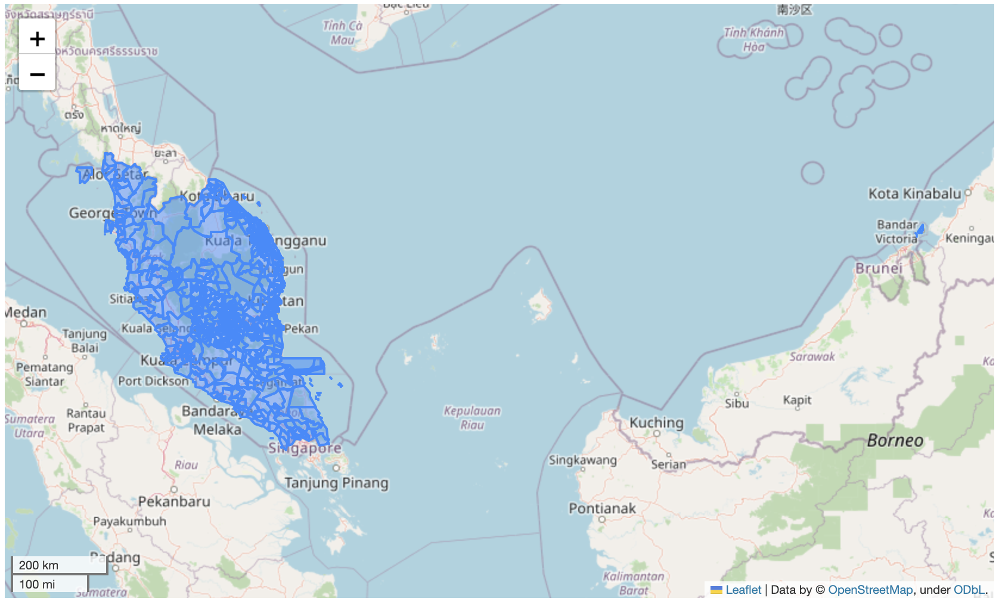

In [512]:
#Only keep the relevant columns
constituency_columns = ['Parliament Code',
                   'Parliament',
                  'State',
                  'geometry']
msia_constituency_map = msia_constituencies[constituency_columns]

In [ ]:
#Checking if it worked
msia_constituency_map.explore()

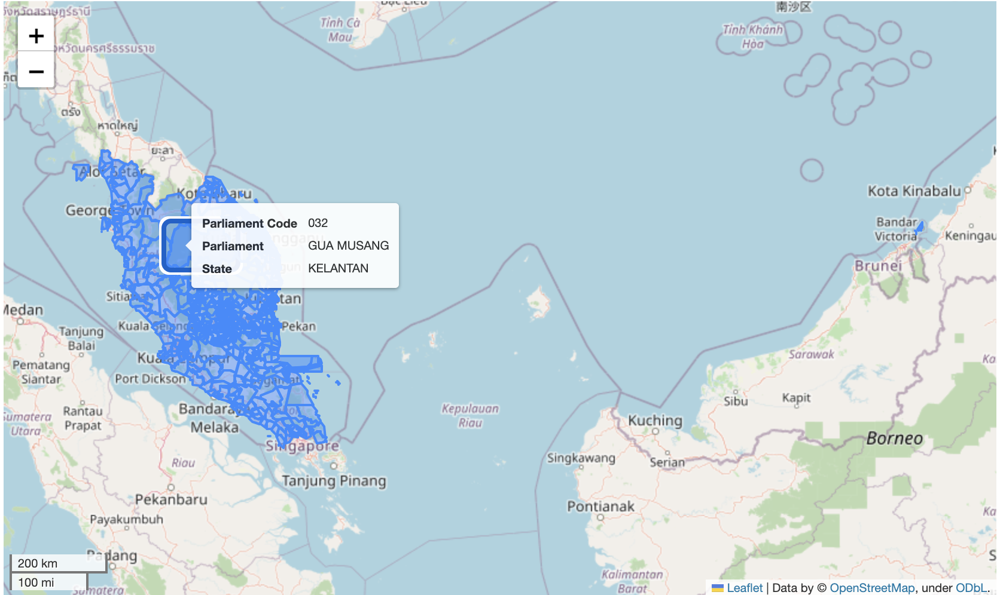

## Creating map of election results

- Link to original source of data: https://github.com/TindakMalaysia/GE15-Dataset-ARCHIVED-/blob/main/MALAYSIA_GE15_PARLIAMENT_ELECTIONS_v25122022.csv
- Data is also available in my repo

In [515]:
#Loading the data on election results
election_df = pd.read_csv('/data/msia_election_results.csv')
election_df.head()

,UNIQUE CODE,STATE,PARLIAMENTARY CODE,PARLIAMENTARY NAME,WINNING PARTY,UNCONTESTED VICTORY,TOTAL ELECTORATE,WINNING MAJORITY,TURNOUT (%),TOTAL BALLOTS ISSUED,...,INDEPENDENT (3),INDEPENDENT (3) CANDIDATE,INDEPENDENT (3) CANDIDATE GENDER,INDEPENDENT (3) CANDIDATE AGE,INDEPENDENT (3) VOTE,INDEPENDENT (4),INDEPENDENT (4) CANDIDATE,INDEPENDENT (4) CANDIDATE GENDER,INDEPENDENT (4) CANDIDATE AGE,INDEPENDENT (4) VOTE
0,P.001,PERLIS,P.001,PADANG BESAR,PN - PAS,NaN,60192,12514,76.52,46059,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,P.002,PERLIS,P.002,KANGAR,PN - PPBM,NaN,74859,9192,76.13,56989,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,P.003,PERLIS,P.003,ARAU,PN - DIRECT,NaN,60876,23216,78.20,47605,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,P.004,KEDAH,P.004,LANGKAWI,PN - PPBM,NaN,66777,13518,72.07,48123,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,P.005,KEDAH,P.005,JERLUN,PN - PAS,NaN,67601,20456,78.27,52909,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [516]:
#Only keeping constituencies from peninsular malaysia
penin_election_df = election_df[election_df['STATE'] != 'SABAH']
penin_election_df = penin_election_df[penin_election_df['STATE'] != 'SARAWAK']

In [517]:
#Looking at the columns available and checking that the amount of constituencies is consistent with map
penin_election_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 166 entries, 0 to 165
Data columns (total 78 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   UNIQUE CODE                       166 non-null    object 
 1   STATE                             166 non-null    object 
 2   PARLIAMENTARY CODE                166 non-null    object 
 3   PARLIAMENTARY NAME                166 non-null    object 
 4   WINNING PARTY                     166 non-null    object 
 5   UNCONTESTED VICTORY               0 non-null      float64
 6   TOTAL ELECTORATE                  166 non-null    int64  
 7   WINNING MAJORITY                  166 non-null    int64  
 8   TURNOUT (%)                       166 non-null    float64
 9   TOTAL BALLOTS ISSUED              166 non-null    int64  
 10  TOTAL UNRETURNED VOTES            166 non-null    int64  
 11  TOTAL REJECTED VOTES              166 non-null    int64  
 12  TOTAL VALID V

In [518]:
#Only keeping relevant columns
results_column = ['PARLIAMENTARY CODE', 'WINNING PARTY']
election_results = penin_election_df[results_column]

In [519]:
#Renaming Parliamentary Code
p_code = {'PARLIAMENTARY CODE': 'Parliament Code'}
election_results = election_results.rename(columns= p_code )

In [520]:
#Getting rid of the 'P.' at the front of the parliament code for consistency with map
election_results['Parliament Code'] = election_results['Parliament Code'].str[2:]
election_results.head()

,Parliament Code,WINNING PARTY
0,001,PN - PAS
1,002,PN - PPBM
2,003,PN - DIRECT
3,004,PN - PPBM
4,005,PN - PAS


In [521]:
#Looking at the options for the winning party in peninsular malaysia
election_results['WINNING PARTY'].unique()

array(['PN - PAS', 'PN - PPBM', 'PN - DIRECT', 'PH - PKR', 'PH - DAP',
       'BN - UMNO', 'BN - MIC', 'PH - PAN', 'MUDA', 'BN - MCA'],
      dtype=object)

In [522]:
#Merging election result data with map data
election_map = pd.merge(election_results, msia_constituency_map, on='Parliament Code')
election_map.head()

,Parliament Code,WINNING PARTY,Parliament,State,geometry
0,001,PN - PAS,PADANG BESAR,PERLIS,"POLYGON ((100.22571 6.69592, 100.22931 6.69373..."
1,002,PN - PPBM,KANGAR,PERLIS,"POLYGON ((100.16431 6.57532, 100.16431 6.57129..."
2,003,PN - DIRECT,ARAU,PERLIS,"POLYGON ((100.36432 6.48511, 100.36371 6.46368..."
3,004,PN - PPBM,LANGKAWI,KEDAH,"MULTIPOLYGON (((99.71217 6.36303, 99.70911 6.3..."
4,005,PN - PAS,JERLUN,KEDAH,"MULTIPOLYGON (((100.35874 6.42045, 100.35939 6..."


In [523]:
#Creating a geodataframe from merged data
election_gdf = gpd.GeoDataFrame(election_map, geometry='geometry')

In [527]:
#Setting the crs
election_gdf = election_gdf.set_crs('epsg:4326')

In [528]:
#Making an interative map with all the info
election_gdf.explore()

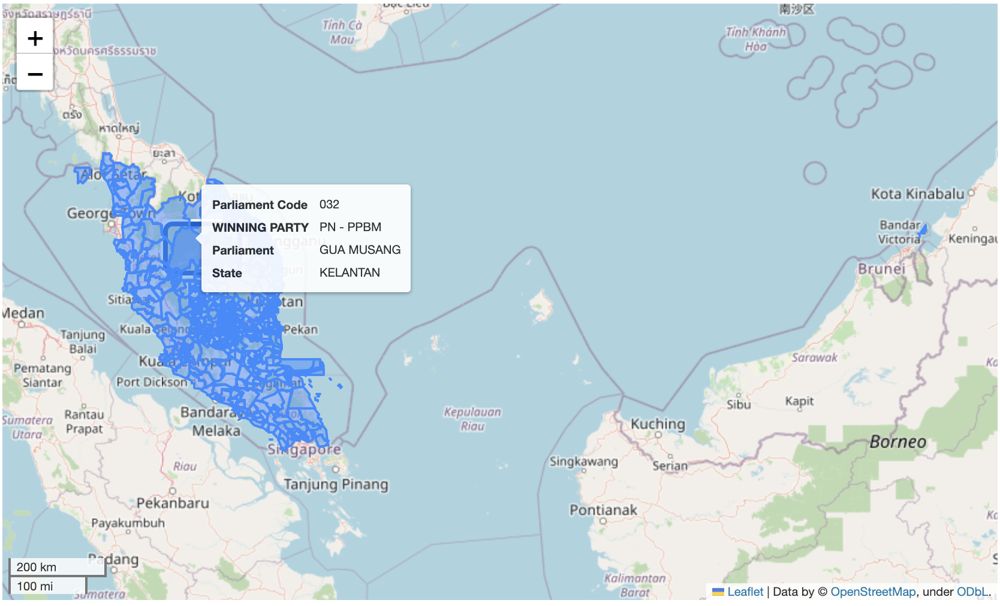

In [ ]:
#Creating an interactive map with colours to distinguish between parties
fig_election = px.choropleth_mapbox(election_gdf,
                           geojson= election_gdf.geometry,
                                    locations=election_gdf.index,
                                    color='WINNING PARTY',
                                    color_discrete_map={'PN - PAS': 'green',
                                                        'PN - PPBM': 'purple',
                                                        'PN - DIRECT': 'grey',
                                                        'PH - PKR': 'red',
                                                        'PH - DAP': 'white',
                                                        'PH - PKR': 'blue',
                                                        'PH - PAN': 'brown',
                                                        'BN - UMNO': 'yellow',
                                                        'BN - MIC': 'pink',
                                                        'BN - MCA': 'orange',
                                                        'MUDA': 'black'},
                                    center = {"lat": 3.9743, "lon": 102.4381},                                    opacity=0.5, labels={'category':'Category'},
                                    mapbox_style="carto-positron",
                                    zoom=5,
                                    hover_data={"WINNING PARTY":True})


fig_election.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_election.show()

In [ ]:
#Creating an interactive map with colours to distinguish between coalitions
fig_coalition = px.choropleth_mapbox(election_gdf,
                           geojson= election_gdf.geometry,
                                    locations=election_gdf.index,
                                    color='WINNING PARTY',
                                    color_discrete_map={'PN - PAS': 'green',
                                                        'PN - PPBM': 'green',
                                                        'PN - DIRECT': 'green',
                                                        'PH - PKR': 'red',
                                                        'PH - DAP': 'red',
                                                        'PH - PKR': 'red',
                                                        'PH - PAN': 'red',
                                                        'BN - UMNO': 'blue',
                                                        'BN - MIC': 'blue',
                                                        'BN - MCA': 'blue',
                                                        'MUDA': 'black'},
                                    center = {"lat": 3.9743, "lon": 102.4381},                                    opacity=0.5, labels={'category':'Category'},
                                    mapbox_style="carto-positron",
                                    zoom=5,
                                    hover_data={"WINNING PARTY":True})


fig_coalition.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_coalition.show()

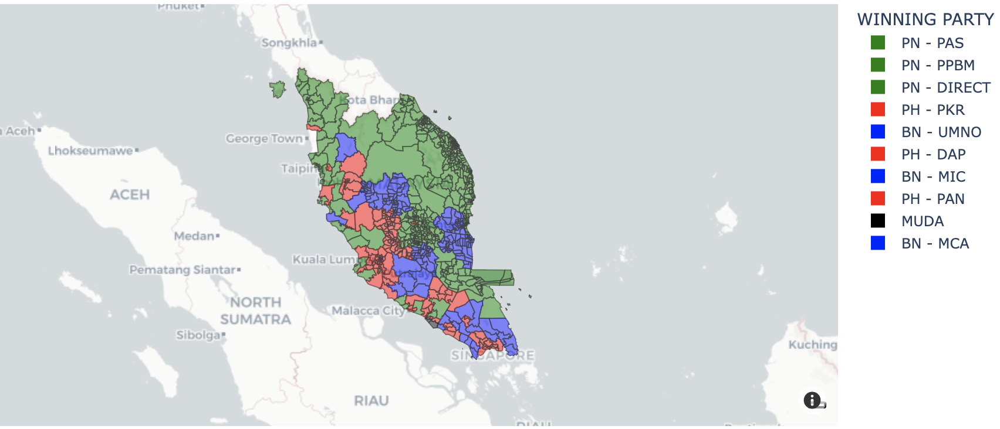

## Preparing map of districts

- Link to original source of shapefile: https://searchworks.stanford.edu/view/zd362bc5680
- Data can also be found in my github

In [531]:
import geopandas as gpd
#Loading the shapefile for districts
msia_dbf = "/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/shapefiles/msia_districts.dbf"

#Reading the file
msia_df = gpd.read_file(msia_dbf)
msia_df

,f_code,coc,nam,laa,pop,ypc,adm_code,salb,soc,geometry
0,FA001,MYS,KELANTAN,GUA MUSANG,-99999999,0,UNK,UNK,MYS,"POLYGON ((101.58979 4.55280, 101.58880 4.55438..."
1,FA001,MYS,JOHOR,KOTA TINGGI,-99999999,0,UNK,UNK,MYS,"POLYGON ((103.72271 1.66005, 103.72056 1.66298..."
2,FA001,MYS,JOHOR,SEGAMAT,-99999999,0,UNK,UNK,MYS,"POLYGON ((102.70207 2.83330, 102.71049 2.83064..."
3,FA001,MYS,PAHANG,BERA,-99999999,0,UNK,UNK,MYS,"POLYGON ((102.70207 2.83330, 102.70186 2.83363..."
4,FA001,MYS,PAHANG,ROMPIN,-99999999,0,UNK,UNK,MYS,"POLYGON ((102.70289 3.31518, 102.70296 3.31524..."
...,...,...,...,...,...,...,...,...,...,...
231,FA001,MYS,SABAH,KUDAT,-99999999,0,UNK,UNK,MYS,"POLYGON ((117.33995 7.27316, 117.34082 7.27270..."
232,FA001,MYS,SABAH,SEMPORNA,-99999999,0,UNK,UNK,MYS,"POLYGON ((118.78781 4.58668, 118.78745 4.58640..."
233,FA001,MYS,SABAH,SEMPORNA,-99999999,0,UNK,UNK,MYS,"POLYGON ((118.76195 4.41550, 118.76195 4.41550..."
234,FA001,MYS,SABAH,SANDAKAN,-99999999,0,UNK,UNK,MYS,"POLYGON ((118.10109 5.90575, 118.10128 5.90518..."


In [532]:
#Changing column name of state and district
state_column_names = {'nam': 'STATE',
                    'laa': 'DISTRICT',}
msia_df = msia_df.rename(columns=state_column_names)

In [533]:
msia_gdf = msia_df.set_crs('epsg:4326')
msia_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [535]:
#Looking at info
msia_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   f_code    236 non-null    object  
 1   coc       236 non-null    object  
 2   STATE     236 non-null    object  
 3   DISTRICT  236 non-null    object  
 4   pop       236 non-null    int64   
 5   ypc       236 non-null    int64   
 6   adm_code  236 non-null    object  
 7   salb      236 non-null    object  
 8   soc       236 non-null    object  
 9   geometry  236 non-null    geometry
dtypes: geometry(1), int64(2), object(7)
memory usage: 18.6+ KB


In [ ]:
msia_gdf.explore()

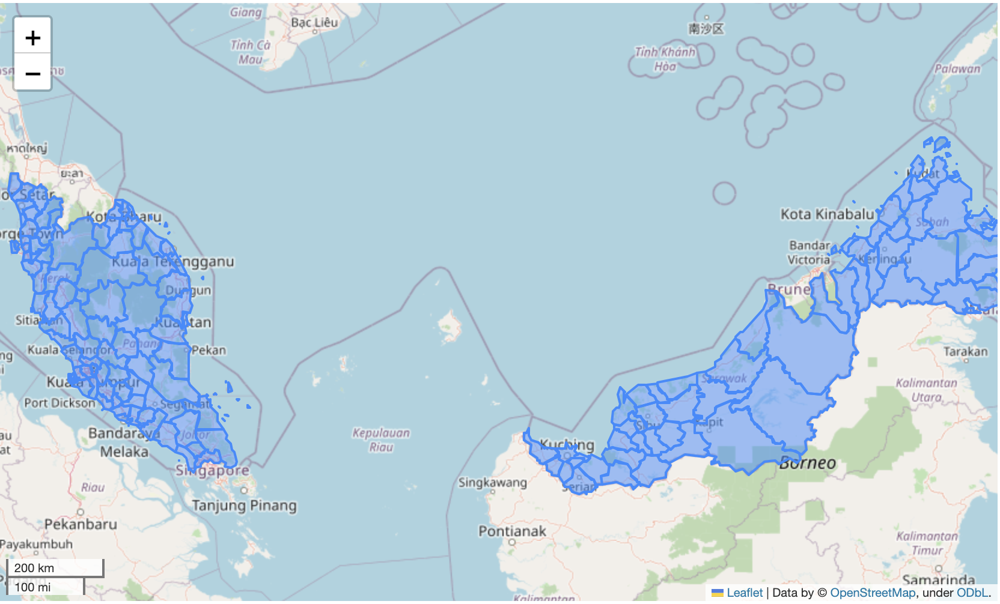

In [537]:
#Seeing unique values of the state
states = msia_gdf['STATE'].unique()
print(states)

['KELANTAN' 'JOHOR' 'PAHANG' 'PERAK' 'TERENGGANU' 'SELANGOR'
 'NEGERI SEMBILAN' 'KEDAH' 'MELAKA' 'PULAU PINANG' 'PERLIS'
 'WILAYAH PERSEKUTUAN' 'SARAWAK' 'SABAH' 'WILAYAH PERSEKUTUAN LABUAN']


In [538]:
#Creating dataframe with only peninsular malaysia
penin_msia = msia_gdf[msia_gdf['STATE'] != 'SABAH']
penin_msia = penin_msia[penin_msia['STATE'] != 'SARAWAK']

In [539]:
#Looking at info on gdf
penin_msia.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 128 entries, 0 to 218
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   f_code    128 non-null    object  
 1   coc       128 non-null    object  
 2   STATE     128 non-null    object  
 3   DISTRICT  128 non-null    object  
 4   pop       128 non-null    int64   
 5   ypc       128 non-null    int64   
 6   adm_code  128 non-null    object  
 7   salb      128 non-null    object  
 8   soc       128 non-null    object  
 9   geometry  128 non-null    geometry
dtypes: geometry(1), int64(2), object(7)
memory usage: 11.0+ KB


In [ ]:
#Checking that the map is only peninsular malaysia
penin_msia.explore()

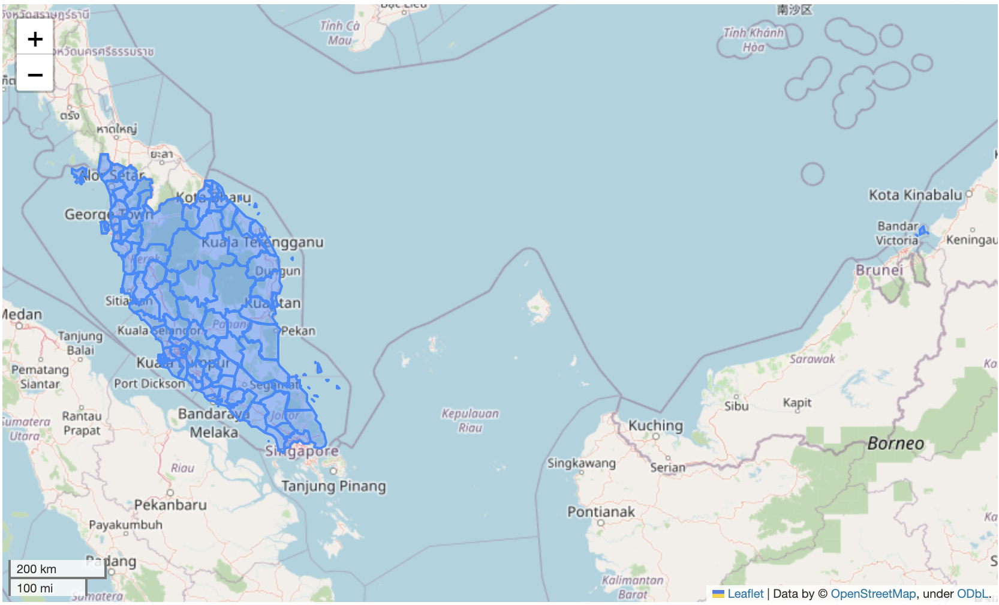

## Loading Household Income and Expenditure Data

- Link to parquet: https://data.gov.my/data-catalogue/hies_district

In [542]:
#Loading the data
income_data = 'https://storage.dosm.gov.my/hies/hies_district.parquet'

income_df = pd.read_parquet(income_data)
print(income_df)

           date              state           district  income_mean  \
0    2022-01-01              Johor         Batu Pahat         7419   
1    2022-01-01              Johor        Johor Bahru         9869   
2    2022-01-01              Johor             Kluang         6461   
3    2022-01-01              Johor        Kota Tinggi         7529   
4    2022-01-01              Johor            Mersing         5426   
..          ...                ...                ...          ...   
155  2022-01-01            Sarawak             Beluru         4873   
156  2022-01-01            Sarawak        Telang Usan         4692   
157  2022-01-01  W.P. Kuala Lumpur  W.P. Kuala Lumpur        13325   
158  2022-01-01        W.P. Labuan        W.P. Labuan         8250   
159  2022-01-01     W.P. Putrajaya     W.P. Putrajaya        13473   

     income_median  expenditure_mean     gini  poverty  
0             6347              4570  0.33830      5.1  
1             8232              6139  0.35850

In [543]:
#Editing dataframe with only peninsular malaysia
income_df = income_df[income_df['state'] != 'Sabah']
income_df = income_df[income_df['state'] != 'Sarawak']

In [544]:
#Changing column names
new_column_names = {'district': 'DISTRICT',
                   'income_mean': 'Mean Income',
                   'gini': 'Gini Coefficient'}
income_df = income_df.rename(columns=new_column_names)

In [545]:
#Changing state so it is all in capital letters
income_df['DISTRICT'] = income_df['DISTRICT'].str.upper()

In [546]:
#Dropping date
income_df = income_df.drop('date', axis=1)
income_df = income_df.drop('state', axis=1)

In [547]:
income_df.head()

,DISTRICT,Mean Income,income_median,expenditure_mean,Gini Coefficient,poverty
0,BATU PAHAT,7419,6347,4570,0.33830,5.1
1,JOHOR BAHRU,9869,8232,6139,0.35850,3.7
2,KLUANG,6461,5204,4399,0.35367,7.2
3,KOTA TINGGI,7529,6227,4498,0.34335,5.0
4,MERSING,5426,4445,4032,0.33877,12.7


In [549]:
# Checking the unique values of 'DISTRICT' in each dataset as the map may be outdated
filt_income = set(income_df['DISTRICT'])
filt_penin_msia = set(penin_msia['DISTRICT'])


values_in_income = filt_income - filt_penin_msia
values_in_map = filt_penin_msia - filt_income

print("Values only in Income data:", values_in_income)
print("Values only in Map data:", values_in_map)

Values only in Income data: {'KECIL LOJING', 'BAGAN DATUK', 'MUALLIM', 'W.P. KUALA LUMPUR', 'TIMUR LAUT', 'PERLIS', 'KAMPAR', 'W.P. PUTRAJAYA', 'W.P. LABUAN', 'POKOK SENA', 'KUALA NERUS', 'TANGKAK', 'KULAI', 'LARUT DAN MATANG', 'CAMERON HIGHLANDS', 'ULU SELANGOR'}
Values only in Map data: {'LEDANG', 'PULAU DAYANG BUNTING', 'KANGAR', 'PULAU TUBA', 'HULU SELANGOR', 'PULAU REDANG', 'TIMOR LAUT', 'KULAI JAYA', 'ALOR SETAR', 'CAMERON HIGHLAND', 'PULAU SINGA BESAR', 'WILAYAH PERSEKUTUAN LABUAN', 'LARUT & MATANG', 'KUALA LUMPUR'}


In [550]:
#Recoding the data so it matches in both dataset
income_df['DISTRICT'] = income_df['DISTRICT'].replace('ULU SELANGOR', 'HULU SELANGOR') #hulu selangor was spelled wrong
income_df['DISTRICT'] = income_df['DISTRICT'].replace('CAMERON HIGHLANDS', 'CAMERON HIGHLAND') #colloquially interchangeable
income_df['DISTRICT'] = income_df['DISTRICT'].replace('KULAI', 'KULAI JAYA') #colloquially interchangeable
income_df['DISTRICT'] = income_df['DISTRICT'].replace('KECIL LOJING', 'GUA MUSANG') #Previously part of gua musang
income_df['DISTRICT'] = income_df['DISTRICT'].replace('KAMPAR', 'KINTA') #Previously part of kinta
income_df['DISTRICT'] = income_df['DISTRICT'].replace('BAGAN DATUK', 'HILIR PERAK') #Previously part of hilir perak
income_df['DISTRICT'] = income_df['DISTRICT'].replace('MUALLIM', 'BATANG PADANG') #Previously part of Batang Padang
income_df['DISTRICT'] = income_df['DISTRICT'].replace('W.P. PUTRAJAYA', 'SEPANG') #Previously part of Batang Padang
income_df['DISTRICT'] = income_df['DISTRICT'].replace('POKOK SENA', 'KOTA SETAR') #Previously part of kota setar

#These are all islands that are now officially a part of the langkawi district
penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('PULAU DAYANG BUNTING', 'LANGKAWI')
penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('PULAU TUBA', 'LANGKAWI')
penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('PULAU SINGA BESAR', 'LANGKAWI')

penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('ALOR SETAR', 'KOTA SETAR') #official name is kota setar
penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('PULAU REDANG', 'KUALA NERUS') #official name is kuala nerus
penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('LEDANG', 'TANGKAK') #official name is tangkak

penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('KANGAR', 'PERLIS') #colloquially interchangeable
penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('KUALA LUMPUR', 'W.P. KUALA LUMPUR') #colloquially interchangeable
penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('WILAYAH PERSEKUTUAN LABUAN', 'W.P. LABUAN') #colloquially interchangeable

penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('LARUT & MATANG', 'LARUT DAN MATANG') #dan means 'and' in malay
penin_msia['DISTRICT'] = penin_msia['DISTRICT'].replace('TIMOR LAUT', 'TIMUR LAUT') #different spelling

In [551]:
# Rechecking the unique values of 'DISTRICT' in each dataset
filt_income = set(income_df['DISTRICT'])
filt_penin_msia = set(penin_msia['DISTRICT'])

values_in_income = filt_income - filt_penin_msia
values_in_map = filt_penin_msia - filt_income

print("Values only in Income data:", values_in_income)
print("Values only in Map data:", values_in_map)

#Managed to successfully match the data

Values only in Income data: set()
Values only in Map data: set()


In [552]:
#Combining income data with geographical data
income_w_geo = pd.merge(income_df, penin_msia, on='DISTRICT')
income_w_geo.head()

,DISTRICT,Mean Income,income_median,expenditure_mean,Gini Coefficient,poverty,f_code,coc,STATE,pop,ypc,adm_code,salb,soc,geometry
0,BATU PAHAT,7419,6347,4570,0.33830,5.1,FA001,MYS,JOHOR,-99999999,0,UNK,UNK,MYS,"POLYGON ((103.22622 1.76703, 103.22586 1.76621..."
1,JOHOR BAHRU,9869,8232,6139,0.35850,3.7,FA001,MYS,JOHOR,-99999999,0,UNK,UNK,MYS,"POLYGON ((103.72271 1.66005, 103.72695 1.66259..."
2,KLUANG,6461,5204,4399,0.35367,7.2,FA001,MYS,JOHOR,-99999999,0,UNK,UNK,MYS,"POLYGON ((103.37998 2.37910, 103.39456 2.38159..."
3,KOTA TINGGI,7529,6227,4498,0.34335,5.0,FA001,MYS,JOHOR,-99999999,0,UNK,UNK,MYS,"POLYGON ((103.72271 1.66005, 103.72056 1.66298..."
4,MERSING,5426,4445,4032,0.33877,12.7,FA001,MYS,JOHOR,-99999999,0,UNK,UNK,MYS,"POLYGON ((103.37998 2.37910, 103.37360 2.39342..."


## Mapping mean income and gini

In [553]:
#Changing merged dataframe to geodataframe
income_gdf = gpd.GeoDataFrame(income_w_geo, geometry='geometry')

In [554]:
#Setting the coordinate reference system
income_gdf = income_gdf.set_crs('epsg:4326')

In [ ]:
#Exploring the map
income_gdf.explore()

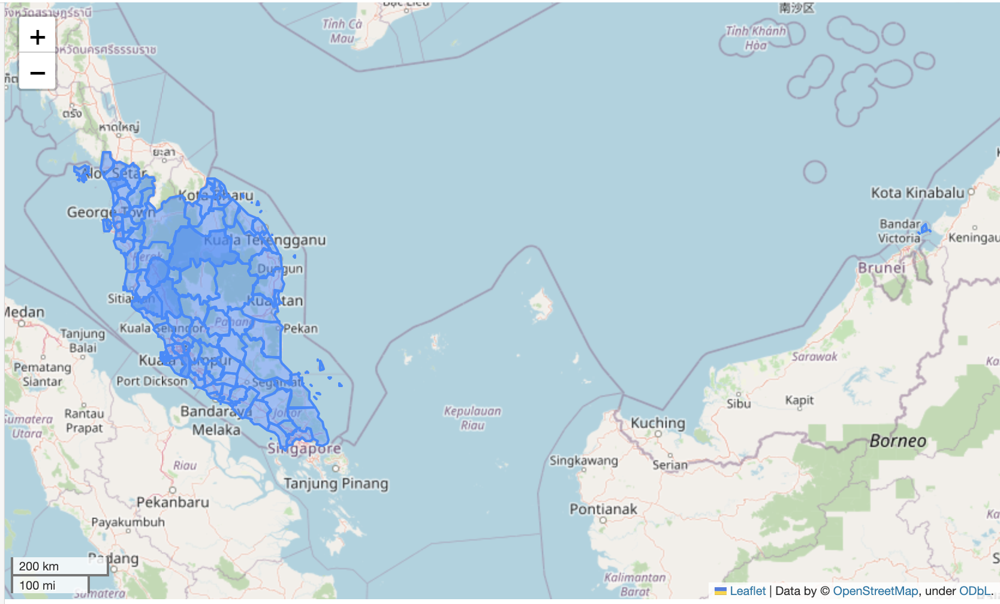

In [556]:
#Checking range of all the columns
income_df.describe()

,Mean Income,income_median,expenditure_mean,Gini Coefficient,poverty
count,93.000000,93.000000,93.000000,93.000000,93.000000
mean,6599.623656,5314.107527,4342.967742,0.339086,7.354839
std,2372.690424,1972.314682,1177.656372,0.039440,6.073401
min,3153.000000,2630.000000,2720.000000,0.229150,0.000000
25%,4987.000000,3953.000000,3567.000000,0.307560,3.300000
50%,5956.000000,4743.000000,4033.000000,0.346460,6.000000
75%,7472.000000,6220.000000,4740.000000,0.365430,10.500000
max,13673.000000,12608.000000,8897.000000,0.413790,43.800000


In [ ]:
#Mean income choropleth
fig_mean_income = px.choropleth_mapbox(income_gdf,
                           geojson=income_gdf.geometry,
                           locations=income_gdf.index,
                           color="Mean Income",
                           color_continuous_scale="tealrose",
                           range_color=(3000, 14000),
                           opacity=0.75,
                           center={"lat": 3.9743, "lon": 102.4381},
                           mapbox_style="carto-positron",
                           zoom=5,
                        hover_data={"DISTRICT": True})

fig_mean_income.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_mean_income.show()

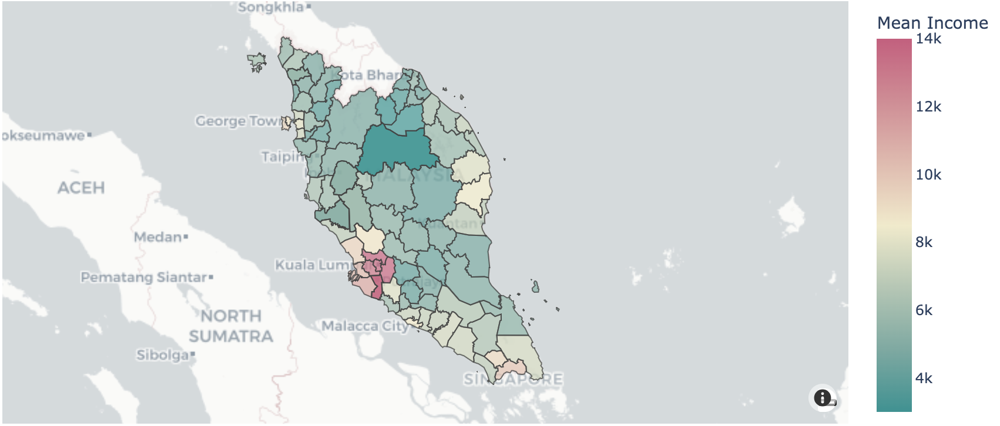

In [ ]:
#Mean gini choropleth
fig_gini = px.choropleth_mapbox(income_gdf,
                           geojson=income_gdf.geometry,
                           locations=income_gdf.index,
                           color="Gini Coefficient",
                           color_continuous_scale="tealrose",
                           range_color=(0.2, 0.5),
                           opacity=0.5,
                           center={"lat": 3.9743, "lon": 102.4381},
                           mapbox_style="carto-positron",
                           zoom=5,
                        hover_data={"DISTRICT": True})
fig_gini.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_gini.show()

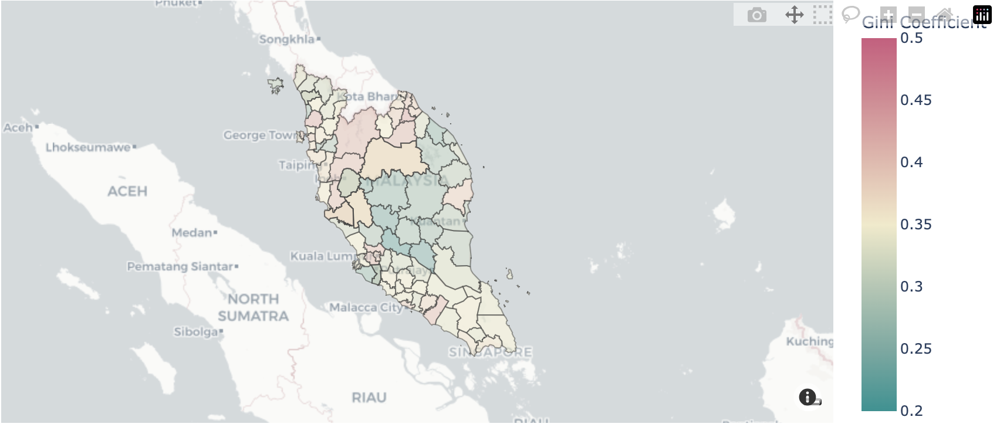

## Percentage of Malay

- Link to source of data: https://data.sinarproject.org/dataset/2022-malaysia-15th-general-elections-voters-demographics
- Data is also available in my github

In [559]:
#Loading data of demographic and election results
demo = pd.read_csv('/Users/sabrinanajib/Downloads/GG4257/UARepo/IRP/data/msia_election_demographic.csv')
demo.head()

,UNIQUE CODE,STATE,PARLIAMENTARY CODE,PARLIAMENTARY NAME,TOTAL ELECTORS,MALAY (%),CHINESE (%),INDIANS (%),ORANG ASLI (%),BUMIPUTERA SABAH (%),...,30-39 (%),40-49 (%),50-59 (%),60-69 (%),70-79 (%),80-89 (%),ABOVE 90 (%),MALE ELECTORS (%),WOMEN ELECTORS (%),URBAN-RURAL CLASSIFICATION (2022)
0,P.001,PERLIS,P.001,PADANG BESAR,60192,86.01,8.14,0.88,0.33,0.57,...,24.86,16.09,12.74,10.78,6.04,1.87,0.35,50.18,49.82,SEMI URBAN
1,P.002,PERLIS,P.002,KANGAR,74859,81.58,14.73,1.57,0.13,0.08,...,23.09,15.83,13.45,11.60,6.04,1.88,0.35,49.54,50.46,SEMI URBAN
2,P.003,PERLIS,P.003,ARAU,60876,87.23,7.81,1.59,0.12,0.09,...,21.90,16.91,15.12,11.39,5.95,2.11,0.33,48.84,51.16,SEMI URBAN
3,P.004,KEDAH,P.004,LANGKAWI,66777,89.65,6.75,2.38,0.30,0.17,...,22.76,17.59,13.22,8.04,3.28,1.00,0.18,50.84,49.16,SEMI URBAN
4,P.005,KEDAH,P.005,JERLUN,67601,90.75,6.78,0.11,0.05,0.04,...,21.58,17.45,15.46,11.64,6.38,2.13,0.31,49.27,50.73,RURAL


In [560]:
#Columns
demo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 222 entries, 0 to 221
Data columns (total 28 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   UNIQUE CODE                        222 non-null    object 
 1   STATE                              222 non-null    object 
 2   PARLIAMENTARY CODE                 222 non-null    object 
 3   PARLIAMENTARY NAME                 222 non-null    object 
 4   TOTAL ELECTORS                     222 non-null    int64  
 5   MALAY (%)                          222 non-null    float64
 6   CHINESE (%)                        222 non-null    float64
 7   INDIANS (%)                        222 non-null    float64
 8   ORANG ASLI (%)                     222 non-null    float64
 9   BUMIPUTERA SABAH (%)               222 non-null    float64
 10  BUMIPUTERA SARAWAK (%)             222 non-null    float64
 11  OTHERS (%)                         222 non-null    float64

In [561]:
#Only keeping peninsular malaysia
demo_penin = demo[demo['STATE'] != 'SABAH']
demo_penin = demo_penin[demo_penin['STATE'] != 'SARAWAK']

In [562]:
#Gettinng rid of the 'P.' to make it consistent with map
demo_penin['PARLIAMENTARY CODE'] = demo_penin['PARLIAMENTARY CODE'].str[2:]

#Changing column name
demo_penin = demo_penin.rename(columns= {'PARLIAMENTARY CODE': 'Parliament Code'})

In [563]:
#Categorising the other bumis that aren't malay
bumi_columns = ['ORANG ASLI (%)', 'BUMIPUTERA SABAH (%)', 'BUMIPUTERA SARAWAK (%)'] 
demo_penin['OTHER BUMI (%)'] = demo_penin[bumi_columns].sum(axis=1)
demo_penin.head()

,UNIQUE CODE,STATE,Parliament Code,PARLIAMENTARY NAME,TOTAL ELECTORS,MALAY (%),CHINESE (%),INDIANS (%),ORANG ASLI (%),BUMIPUTERA SABAH (%),...,40-49 (%),50-59 (%),60-69 (%),70-79 (%),80-89 (%),ABOVE 90 (%),MALE ELECTORS (%),WOMEN ELECTORS (%),URBAN-RURAL CLASSIFICATION (2022),OTHER BUMI (%)
0,P.001,PERLIS,001,PADANG BESAR,60192,86.01,8.14,0.88,0.33,0.57,...,16.09,12.74,10.78,6.04,1.87,0.35,50.18,49.82,SEMI URBAN,0.91
1,P.002,PERLIS,002,KANGAR,74859,81.58,14.73,1.57,0.13,0.08,...,15.83,13.45,11.60,6.04,1.88,0.35,49.54,50.46,SEMI URBAN,0.21
2,P.003,PERLIS,003,ARAU,60876,87.23,7.81,1.59,0.12,0.09,...,16.91,15.12,11.39,5.95,2.11,0.33,48.84,51.16,SEMI URBAN,0.22
3,P.004,KEDAH,004,LANGKAWI,66777,89.65,6.75,2.38,0.30,0.17,...,17.59,13.22,8.04,3.28,1.00,0.18,50.84,49.16,SEMI URBAN,0.47
4,P.005,KEDAH,005,JERLUN,67601,90.75,6.78,0.11,0.05,0.04,...,17.45,15.46,11.64,6.38,2.13,0.31,49.27,50.73,RURAL,0.09


In [564]:
#% Malay
malay_columns = ['Parliament Code', 'MALAY (%)']
malay = demo_penin[malay_columns]

malay.head()

,Parliament Code,MALAY (%)
0,001,86.01
1,002,81.58
2,003,87.23
3,004,89.65
4,005,90.75


In [565]:
#Combining the map with data
malay_map = pd.merge(malay, msia_constituency_map, on='Parliament Code')
malay_map.head()

,Parliament Code,MALAY (%),Parliament,State,geometry
0,001,86.01,PADANG BESAR,PERLIS,"POLYGON ((100.22571 6.69592, 100.22931 6.69373..."
1,002,81.58,KANGAR,PERLIS,"POLYGON ((100.16431 6.57532, 100.16431 6.57129..."
2,003,87.23,ARAU,PERLIS,"POLYGON ((100.36432 6.48511, 100.36371 6.46368..."
3,004,89.65,LANGKAWI,KEDAH,"MULTIPOLYGON (((99.71217 6.36303, 99.70911 6.3..."
4,005,90.75,JERLUN,KEDAH,"MULTIPOLYGON (((100.35874 6.42045, 100.35939 6..."


In [566]:
#Creating the geodataframe and setting CRS
malay_gdf = gpd.GeoDataFrame(malay_map, geometry='geometry')
malay_gdf = malay_gdf.set_crs('epsg:4326')

In [567]:
#looking to see range
malay_gdf.describe()

,MALAY (%)
count,1015.000000
mean,78.485015
std,19.665105
min,5.620000
25%,66.280000
50%,83.960000
75%,95.710000
max,99.230000


In [ ]:
#% Malay Choropleth
fig_malay = px.choropleth_mapbox(malay_gdf,
                           geojson=malay_gdf.geometry,
                           locations=malay_gdf.index,
                           color="MALAY (%)",
                           color_continuous_scale="ylorrd",
                           range_color=(0, 100),
                           opacity=0.75,
                           center={"lat": 3.9743, "lon": 102.4381},
                           mapbox_style="carto-positron",
                           zoom=5,
                        hover_data={"Parliament": True})

fig_malay.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_malay.show()

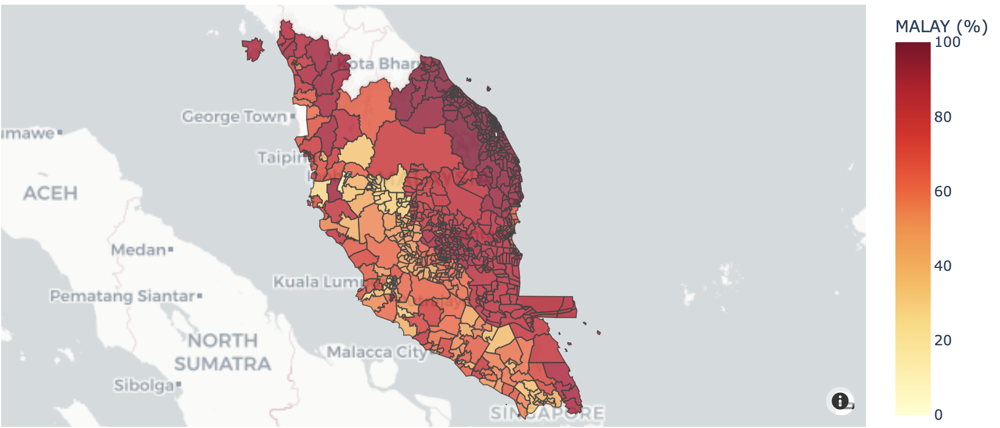

## Percentage of Chinese

In [568]:
#% Chinese
chinese_columns = ['Parliament Code', 'CHINESE (%)']
chinese = demo_penin[chinese_columns]

chinese.head()

,Parliament Code,CHINESE (%)
0,001,8.14
1,002,14.73
2,003,7.81
3,004,6.75
4,005,6.78


In [569]:
#Combining the map with data
chinese_map = pd.merge(chinese, msia_constituency_map, on='Parliament Code')
chinese_map.head()

,Parliament Code,CHINESE (%),Parliament,State,geometry
0,001,8.14,PADANG BESAR,PERLIS,"POLYGON ((100.22571 6.69592, 100.22931 6.69373..."
1,002,14.73,KANGAR,PERLIS,"POLYGON ((100.16431 6.57532, 100.16431 6.57129..."
2,003,7.81,ARAU,PERLIS,"POLYGON ((100.36432 6.48511, 100.36371 6.46368..."
3,004,6.75,LANGKAWI,KEDAH,"MULTIPOLYGON (((99.71217 6.36303, 99.70911 6.3..."
4,005,6.78,JERLUN,KEDAH,"MULTIPOLYGON (((100.35874 6.42045, 100.35939 6..."


In [570]:
#Creating the geodataframe and setting CRS
chinese_gdf = gpd.GeoDataFrame(chinese_map, geometry='geometry')
chinese_gdf = chinese_gdf.set_crs('epsg:4326')

#See the range
chinese_gdf.describe()

,CHINESE (%)
count,1015.000000
mean,13.840355
std,14.479475
min,0.180000
25%,1.870000
50%,8.650000
75%,25.480000
max,85.510000


In [ ]:
#% Chinese Choropleth
fig_chinese = px.choropleth_mapbox(chinese_gdf,
                           geojson=chinese_gdf.geometry,
                           locations=chinese_gdf.index,
                           color="CHINESE (%)",
                           color_continuous_scale="ylgnbu",
                           range_color=(0, 100),
                           opacity=0.75,
                           center={"lat": 3.9743, "lon": 102.4381},
                           mapbox_style="carto-positron",
                           zoom=5,
                        hover_data={"Parliament": True})

fig_chinese.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_chinese.show()

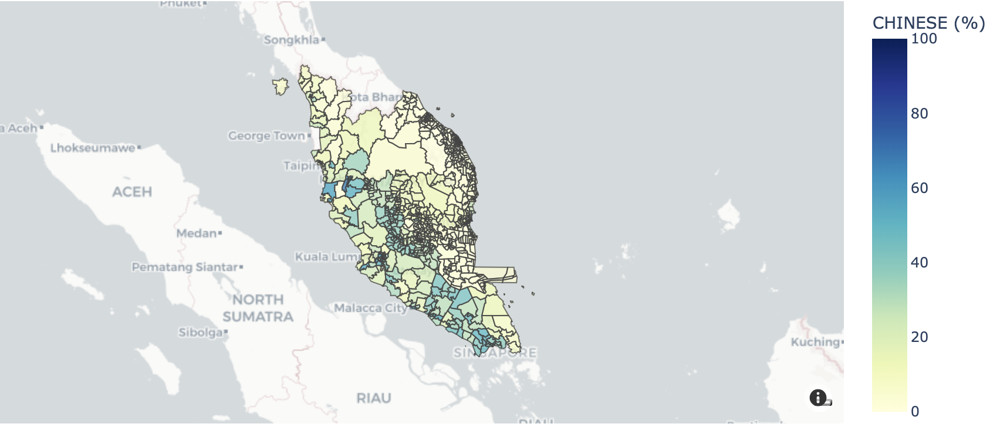

## Percentage of Indians

In [572]:
#% Indian
indian_columns = ['Parliament Code', 'INDIANS (%)']
indian = demo_penin[indian_columns]

indian.head()

,Parliament Code,INDIANS (%)
0,001,0.88
1,002,1.57
2,003,1.59
3,004,2.38
4,005,0.11


In [573]:
#Combining the map with data
indian_map = pd.merge(indian, msia_constituency_map, on='Parliament Code')
indian_map.head()

,Parliament Code,INDIANS (%),Parliament,State,geometry
0,001,0.88,PADANG BESAR,PERLIS,"POLYGON ((100.22571 6.69592, 100.22931 6.69373..."
1,002,1.57,KANGAR,PERLIS,"POLYGON ((100.16431 6.57532, 100.16431 6.57129..."
2,003,1.59,ARAU,PERLIS,"POLYGON ((100.36432 6.48511, 100.36371 6.46368..."
3,004,2.38,LANGKAWI,KEDAH,"MULTIPOLYGON (((99.71217 6.36303, 99.70911 6.3..."
4,005,0.11,JERLUN,KEDAH,"MULTIPOLYGON (((100.35874 6.42045, 100.35939 6..."


In [574]:
#Creating the geodataframe and setting CRS
indian_gdf = gpd.GeoDataFrame(indian_map, geometry='geometry')
indian_gdf = indian_gdf.set_crs('epsg:4326')

#See the range
indian_gdf.describe()

,INDIANS (%)
count,1015.000000
mean,3.417182
std,4.309441
min,0.040000
25%,0.190000
50%,1.380000
75%,5.535000
max,27.340000


In [ ]:
#% Indian Choropleth
fig_indian = px.choropleth_mapbox(indian_gdf,
                           geojson=indian_gdf.geometry,
                           locations=indian_gdf.index,
                           color="INDIANS (%)",
                           color_continuous_scale="ylgn",
                           range_color=(0, 30),
                           opacity=0.75,
                           center={"lat": 3.9743, "lon": 102.4381},
                           mapbox_style="carto-positron",
                           zoom=5,
                        hover_data={"Parliament": True})

fig_indian.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_indian.show()

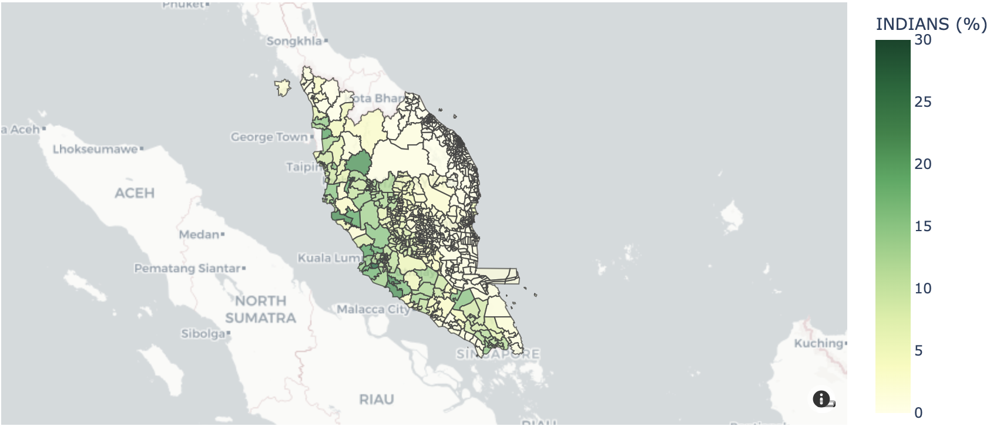

## Youth population

In [576]:
#Looking at the age range available
demo_penin.info()

<class 'pandas.core.frame.DataFrame'>
Index: 166 entries, 0 to 165
Data columns (total 29 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   UNIQUE CODE                        166 non-null    object 
 1   STATE                              166 non-null    object 
 2   Parliament Code                    166 non-null    object 
 3   PARLIAMENTARY NAME                 166 non-null    object 
 4   TOTAL ELECTORS                     166 non-null    int64  
 5   MALAY (%)                          166 non-null    float64
 6   CHINESE (%)                        166 non-null    float64
 7   INDIANS (%)                        166 non-null    float64
 8   ORANG ASLI (%)                     166 non-null    float64
 9   BUMIPUTERA SABAH (%)               166 non-null    float64
 10  BUMIPUTERA SARAWAK (%)             166 non-null    float64
 11  OTHERS (%)                         166 non-null    float64
 12 

In [577]:
#Creating a column of those below the age of 40
youth_ages = ['18-20 (%)',
               '21-29 (%)',
               '30-39 (%)']
demo_penin['YOUTH (%)'] = demo_penin[youth_ages].sum(axis=1)

#Only keeping the relevant columns
youth_columns = ['Parliament Code', 'YOUTH (%)']
youth = demo_penin[youth_columns]

youth.head()

,Parliament Code,YOUTH (%)
0,001,52.13
1,002,50.85
2,003,48.19
3,004,56.69
4,005,46.63


In [578]:
#Combining the map with data
youth_map = pd.merge(youth, msia_constituency_map, on='Parliament Code')
youth_map.head()

,Parliament Code,YOUTH (%),Parliament,State,geometry
0,001,52.13,PADANG BESAR,PERLIS,"POLYGON ((100.22571 6.69592, 100.22931 6.69373..."
1,002,50.85,KANGAR,PERLIS,"POLYGON ((100.16431 6.57532, 100.16431 6.57129..."
2,003,48.19,ARAU,PERLIS,"POLYGON ((100.36432 6.48511, 100.36371 6.46368..."
3,004,56.69,LANGKAWI,KEDAH,"MULTIPOLYGON (((99.71217 6.36303, 99.70911 6.3..."
4,005,46.63,JERLUN,KEDAH,"MULTIPOLYGON (((100.35874 6.42045, 100.35939 6..."


In [579]:
#Creating the geodataframe and setting CRS
youth_gdf = gpd.GeoDataFrame(youth_map, geometry='geometry')
youth_gdf = youth_gdf.set_crs('epsg:4326')

#See the range
youth_gdf.describe()

,YOUTH (%)
count,1015.000000
mean,53.529616
std,4.318355
min,25.270000
25%,50.780000
50%,53.950000
75%,57.705000
max,62.230000


In [ ]:
#Youth Choropleth
fig_youth = px.choropleth_mapbox(youth_gdf,
                           geojson=youth_gdf.geometry,
                           locations=youth_gdf.index,
                           color="YOUTH (%)",
                           color_continuous_scale="ylgn",
                           range_color=(20, 70),
                           opacity=0.75,
                           center={"lat": 3.9743, "lon": 102.4381},
                           mapbox_style="carto-positron",
                           zoom=5,
                        hover_data={"Parliament": True})

fig_youth.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig_youth.show()

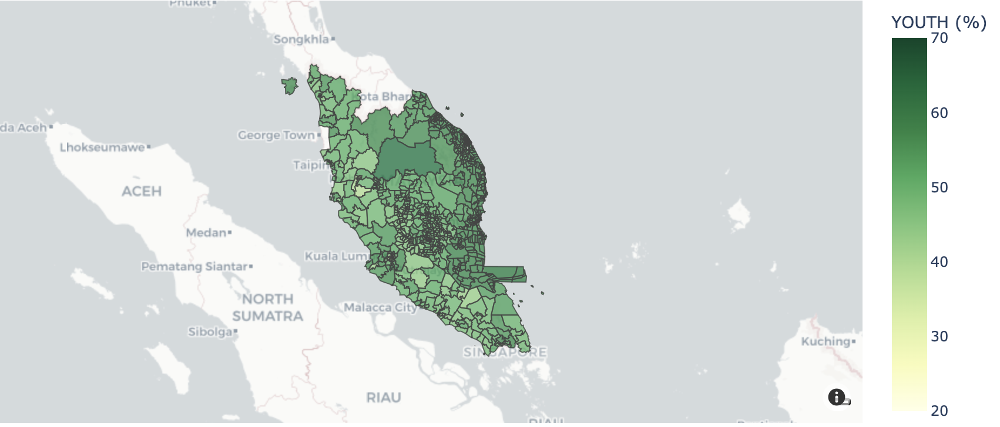

## Performing correlation tests

In [592]:
#Looking at election results data
penin_election_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 166 entries, 0 to 165
Data columns (total 78 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   UNIQUE CODE                       166 non-null    object 
 1   STATE                             166 non-null    object 
 2   PARLIAMENTARY CODE                166 non-null    object 
 3   PARLIAMENTARY NAME                166 non-null    object 
 4   WINNING PARTY                     166 non-null    object 
 5   UNCONTESTED VICTORY               0 non-null      float64
 6   TOTAL ELECTORATE                  166 non-null    int64  
 7   WINNING MAJORITY                  166 non-null    int64  
 8   TURNOUT (%)                       166 non-null    float64
 9   TOTAL BALLOTS ISSUED              166 non-null    int64  
 10  TOTAL UNRETURNED VOTES            166 non-null    int64  
 11  TOTAL REJECTED VOTES              166 non-null    int64  
 12  TOTAL VALID V

In [602]:
#Keeping the vote %
party_columns = ['PARLIAMENTARY CODE',
                 'BN VOTE',
                'PH VOTE',
                'PN VOTE']
party_results = penin_election_df[party_columns]

#Making sure the parliament code is consistent with the demographic results data
p_code = {'PARLIAMENTARY CODE': 'Parliament Code'}
party_results = party_results.rename(columns= p_code )

party_results['Parliament Code'] = party_results['Parliament Code'].str[2:]

party_results.head()

,Parliament Code,BN VOTE,PH VOTE,PN VOTE
0,001,11753.0,7085.0,24267.0
1,002,15370.0,15143.0,24562.0
2,003,8242.0,7089.0,31458.0
3,004,11945.0,5417.0,25463.0
4,005,11229.0,6149.0,31685.0


In [595]:
demo_penin.info()

<class 'pandas.core.frame.DataFrame'>
Index: 166 entries, 0 to 165
Data columns (total 30 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   UNIQUE CODE                        166 non-null    object 
 1   STATE                              166 non-null    object 
 2   Parliament Code                    166 non-null    object 
 3   PARLIAMENTARY NAME                 166 non-null    object 
 4   TOTAL ELECTORS                     166 non-null    int64  
 5   MALAY (%)                          166 non-null    float64
 6   CHINESE (%)                        166 non-null    float64
 7   INDIANS (%)                        166 non-null    float64
 8   ORANG ASLI (%)                     166 non-null    float64
 9   BUMIPUTERA SABAH (%)               166 non-null    float64
 10  BUMIPUTERA SARAWAK (%)             166 non-null    float64
 11  OTHERS (%)                         166 non-null    float64
 12 

In [598]:
#Only keeping relevant columns
demo_column = ['Parliament Code',
              'MALAY (%)',
              'CHINESE (%)',
              'INDIANS (%)',
              'YOUTH (%)']
demo_results = demo_penin[demo_column]
demo_results.head()

,Parliament Code,MALAY (%),CHINESE (%),INDIANS (%),YOUTH (%)
0,001,86.01,8.14,0.88,52.13
1,002,81.58,14.73,1.57,50.85
2,003,87.23,7.81,1.59,48.19
3,004,89.65,6.75,2.38,56.69
4,005,90.75,6.78,0.11,46.63


In [603]:
#Combining demographic and election results data
msia_data = pd.merge(demo_results, party_results, on='Parliament Code')
msia_data.head()

,Parliament Code,MALAY (%),CHINESE (%),INDIANS (%),YOUTH (%),BN VOTE,PH VOTE,PN VOTE
0,001,86.01,8.14,0.88,52.13,11753.0,7085.0,24267.0
1,002,81.58,14.73,1.57,50.85,15370.0,15143.0,24562.0
2,003,87.23,7.81,1.59,48.19,8242.0,7089.0,31458.0
3,004,89.65,6.75,2.38,56.69,11945.0,5417.0,25463.0
4,005,90.75,6.78,0.11,46.63,11229.0,6149.0,31685.0


In [604]:
#Standardisation between variables
numeric_columns = msia_data.select_dtypes(include='float64')
z_score_df = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_df.head()

,MALAY (%),CHINESE (%),INDIANS (%),YOUTH (%),BN VOTE,PH VOTE,PN VOTE
0,0.945462,-0.877637,-1.062400,0.378634,-0.899123,-0.856907,-0.235539
1,0.762961,-0.551824,-0.956344,0.165471,-0.483857,-0.582328,-0.217646
2,0.995722,-0.893953,-0.953270,-0.277510,-1.302219,-0.856771,0.200616
3,1.095418,-0.946360,-0.831844,1.138029,-0.877080,-0.913744,-0.162998
4,1.140734,-0.944876,-1.180752,-0.537303,-0.959283,-0.888801,0.214384


In [ ]:
#Correlation test between the variables
corr = z_score_df.corr()
corr.style.background_gradient(cmap='coolwarm')

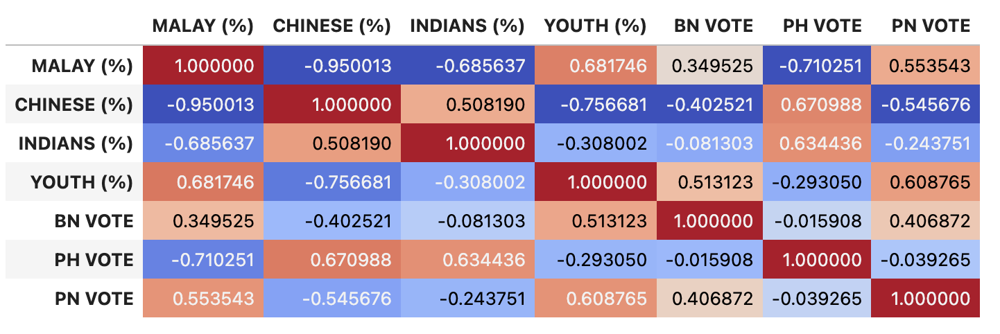